# Assignment-2

**Due Date:** 02.12.2023

---------------------------------------

**Instructor:** Ali Seydi KEÇELİ

**TA:** Görkem Akyıldız

---------------------------------------
**Student Name Surname**: Melike Nur DULKADİR
**Student ID**: 21992919

The aim of this project is to acquaint oneself with Hough Transform and HoG features. In the initial phase of the project, efforts will be directed towards identifying circles in the provided images using the Hough Transform (refer to Figure 1). Subsequently, the same approach employed in the first phase will be utilized for recognizing the given coins by leveraging their HoG features in the project's second phase.

In [1]:
# Importing necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
from sklearn.svm import SVC
import warnings
from scipy import signal
warnings.filterwarnings(action="ignore")

# PART 1: Edge Detection and Hough Transform
The Hough transform serves as a feature extraction technique extensively applied in image analysis, computer vision, and digital image processing. Its primary objective is to identify imperfect instances of objects within a specific class of shapes through a voting procedure. This voting process takes place in a parameter space, leading to the derivation of object candidates as local maxima within an explicitly constructed accumulator space by the algorithm responsible for computing the Hough transform.

The hough_circle_with_gradient function detects circles in an input image using the Hough Transform with gradient information. It takes image as input and specifies the range of circle radii with min_rad and max_rad. The function outputs hough_space, a 3D array representing accumulated votes for circle parameters. The algorithm utilizes Sobel operators to compute gradient magnitude and direction, enhancing circle detection precision. By iterating through non-zero pixels in the image, the function accumulates votes in the Hough space for potential circle parameters.

In [2]:
def hough_circle_with_gradient(image, min_rad, max_rad):
    """
    Detect circles in the given image using Hough Transform with gradient information.

    Parameters:
    - image: The input image.
    - min_rad: Minimum radius of the circles to be detected.
    - max_rad: Maximum radius of the circles to be detected.

    Returns:
    - hough_space: Hough space representing accumulated votes for circle parameters.
    """

    height, width = image.shape

    # Initialize Hough space
    hough_space = np.zeros((height, width, max_rad + 1), dtype=np.uint64)

    # Compute gradients using Sobel operator
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    gradient_direction = np.arctan2(gradient_y, gradient_x)

    for x in range(width):
        for y in range(height):
            if image[y][x] != 0:
                for r in range(min_rad, max_rad + 1):
                    # Get the gradient direction at the current pixel
                    theta = gradient_direction[y, x]

                    # Calculate circle parameters
                    a = int(x - r * np.cos(theta))
                    b = int(y - r * np.sin(theta))

                    # Ensure that the calculated indices are within bounds
                    if 0 <= a < width and 0 <= b < height:
                        # Accumulate votes in Hough space
                        hough_space[b, a, r] += gradient_magnitude[y, x]

    return hough_space

The find_circles function extracts circles from a provided Hough space based on a specified threshold. The function takes hough_space, threshold, and an optional min_distance parameter. Using a vectorized approach, it identifies values in the Hough space exceeding the threshold and returns a list of tuples representing the detected circles' (x, y, r) parameters.

In [3]:
def find_circles(hough_space, threshold, min_distance=10):
    """
    Extract circles from the given Hough space based on the specified threshold.

    Parameters:
    - hough_space: The Hough space containing accumulated votes for circle parameters.
    - threshold: The threshold value for circle detection.
    - min_distance: Minimum distance between detected circles (default is 10).

    Returns:
    - circles: A list of tuples representing (x, y, r) for detected circles.
    """

    height, width, _ = hough_space.shape
    circles = []

    # Vectorized approach to find values exceeding the threshold
    y, x, r = np.where(hough_space >= threshold)

    # Add values exceeding the threshold to the circles list
    circles.extend(zip(x, y, r))

    return circles

The non_max_suppression function performs non-maximum suppression on a list of circles based on their Hough space values. It takes circles (represented as tuples (x, y, r)), hough_space containing accumulated votes for circle parameters, and an optional min_distance parameter to specify the minimum distance between selected circles (default is 10). The function returns a list of selected_circles after non-maximum suppression.

In [4]:
def non_max_suppression(circles, hough_space, min_distance=10):
    """
    Perform non-maximum suppression on a list of circles based on their Hough space values.

    Parameters:
    - circles: List of circles represented as tuples (x, y, r).
    - hough_space: The Hough space containing accumulated votes for circle parameters.
    - min_distance: Minimum distance between selected circles (default is 10).

    Returns:
    - selected_circles: List of selected circles after non-maximum suppression.
    """

    # Sort circles based on their Hough space values in descending order
    circles = sorted(circles, key=lambda x: hough_space[x[1], x[0], x[2]], reverse=True)

    # List to store the selected circles after non-maximum suppression
    selected_circles = []

    # Initialize an array to keep track of selected regions
    selected_regions = np.zeros_like(hough_space, dtype=bool)

    for circle in circles:
        x, y, r = circle

        # Determine the region indices
        y_slice = slice(max(0, y - min_distance), min(hough_space.shape[0], y + min_distance))
        x_slice = slice(max(0, x - min_distance), min(hough_space.shape[1], x + min_distance))
        r_slice = slice(max(0, r - min_distance), min(hough_space.shape[2], r + min_distance))

        # Check if the region around the current circle is already selected
        if not selected_regions[y_slice, x_slice, r_slice].any():
            # Mark the region around the current circle as selected
            selected_regions[y_slice, x_slice, r_slice] = True

            # Add the current circle to the selected circles
            selected_circles.append(circle)

    return selected_circles

The visualize_results function visualizes the results by drawing detected circles on the original image. It takes original_image as the original input image, edges as the edge map of the image, and detected_circles as a list of detected circles represented as tuples (x, y, r). The function displays a composite image containing the original image, edge map, and detected circles using matplotlib.

In [5]:
def visualize_results(original_image, edges, detected_circles):
    """
    Visualize the results by drawing detected circles on the original image.

    Parameters:
    - original_image: The original input image.
    - edges: Edge map of the image.
    - detected_circles: List of detected circles represented as tuples (x, y, r).

    Returns:
    - result_image: The image with detected circles drawn on it.
    """

    # Draw detected circles on the original image
    if detected_circles is not None:
        result_image = original_image.copy()
        for circle in detected_circles:
            # Draw the circle
            cv2.circle(result_image, (circle[0], circle[1]), circle[2], (0, 255, 0), 2)
            # Draw the outer circle
            cv2.circle(result_image, (circle[0], circle[1]), 2, (0, 0, 255), 3)

        # Create a composite image containing the original image, edge map, and detected circles
        plt.subplot(131), plt.imshow(original_image)
        plt.title('Original Image'), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(edges, cmap='gray')
        plt.title('Edge Map'), plt.xticks([]), plt.yticks([])

        plt.subplot(133), plt.imshow(result_image)
        plt.title('Detected Circles'), plt.xticks([]), plt.yticks([])

        plt.show()

    return result_image

The save_results_to_folder function combines and saves the original input image along with the image featuring detected circles and labels (if present). It accepts original_image, result_image, folder_path, and file_name as parameters. The amalgamated image is then stored in the designated folder with the specified file name. 

In [6]:
def save_results_to_folder(original_image, result_image, folder_path, file_name):
    """
    Save the original and result images side by side in a specified folder.

    Parameters:
    - original_image: The original input image.
    - result_image: The image with detected circles drawn on it.
    - folder_path: The path to the folder where the results will be saved.
    - file_name: The name of the saved file.

    Returns:
    - None
    """

    # Combine original and result images side by side
    combined_image = np.concatenate((original_image, result_image), axis=1)

    # Save the combined image to the specified folder with the given file name
    result_file_path = os.path.join(folder_path, file_name)
    cv2.imwrite(result_file_path, combined_image)

The resize_image function is designed to resize the input image while preserving its aspect ratio. It takes two parameters: image, representing the input image, and target_width, denoting the desired width of the resized image. The function returns the resized_image with the preserved aspect ratio and the actual width of the resized image. If the specified target_width is smaller than the original width, the function performs resizing; otherwise, it returns the original image.

In [7]:
def resize_image(image, target_width):
    """
    Resize the input image while maintaining the aspect ratio.

    Parameters:
    - image: The input image to be resized.
    - target_width: The desired width of the resized image.

    Returns:
    - resized_image: The resized image with the preserved aspect ratio.
    - width: The actual width of the resized image.
    """

    height, width, _ = image.shape
    resized_image = image

    if target_width < width:
        target_height = int((target_width / width) * height)
        resized_image = cv2.resize(image, (target_width, target_height))
        width = int(target_width)

    return resized_image, width

The calculate_radii function determines the minimum and maximum radii based on the given image width. If the image is flagged as a test image, the radii values are adjusted accordingly. The function returns the calculated minimum and maximum radii.

In [8]:
def calculate_radii(width, is_test_image):
    """
    Calculate the minimum and maximum radii based on the image width.

    Parameters:
    - width: The width of the image.
    - is_test_image: A boolean flag indicating whether the image is a test image.

    Returns:
    - min_rad: The calculated minimum radius.
    - max_rad: The calculated maximum radius.
    """

    min_rad = int(width / 5)
    max_rad = int(width / 2)

    if is_test_image:
        min_rad = int(width / 50)
        max_rad = int(width / 10)

    return min_rad, max_rad

The preprocess_image function enhances the input image by applying Gaussian blur and Canny edge detection. It takes image as the input, along with lower and upper thresholds (t_lower and t_upper) for the Canny edge detection. The function returns the preprocessed image with improved edges.

In [9]:
def preprocess_image(image, t_lower, t_upper):
    """
    Preprocess the input image by applying Gaussian blur and Canny edge detection.

    Parameters:
    - image: The input image to be preprocessed.
    - t_lower: The lower threshold for Canny edge detection.
    - t_upper: The upper threshold for Canny edge detection.

    Returns:
    - edges: The preprocessed image after Gaussian blur and Canny edge detection.
    """

    blurred_image = cv2.cvtColor(cv2.GaussianBlur(image, (3, 3), 0), cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(blurred_image, t_lower, t_upper)

    return edges

The process_images_in_folder function facilitates the automated processing of images contained within a specified folder. It iterates through each image, applying a series of image processing steps. These include resizing the image, calculating radii based on the width, and performing edge detection using Canny. The Hough Circle Transform is then employed to detect circles, followed by non-maximum suppression to refine the results. The function visualizes the detected circles on the resized image and saves the results in a designated folder. The list detected_circles_arr accumulates the detected circles for each processed image, providing a comprehensive output. The function returns this list, capturing the results of circle detection across the entire image set.

In [10]:
def process_images_in_folder(folder_path, target_width, threshold_val, is_test_image, t_lower, t_upper):
    """
    Process images in a specified folder by applying a series of image processing steps.

    Parameters:
    - folder_path: The path to the folder containing images.
    - target_width: The desired width for resizing images.
    - threshold_val: The threshold value for circle detection.
    - is_test_image: A boolean flag indicating whether the images are test images.
    - t_lower: The lower threshold for Canny edge detection.
    - t_upper: The upper threshold for Canny edge detection.

    Returns:
    - detected_circles_arr: A list containing detected circles for each processed image.
    """

    image_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith(('.jpg'))]
    detected_circles_arr = []

    for image_path in image_paths:
        original_image = cv2.imread(image_path)
        resized_image, new_width = resize_image(original_image, target_width)

        min_rad, max_rad = calculate_radii(new_width, is_test_image)
        edges = preprocess_image(resized_image, t_lower, t_upper)

        hough_space = hough_circle_with_gradient(edges, min_rad, max_rad)

        threshold = np.max(hough_space) - threshold_val
        detected_circles = find_circles(hough_space, threshold)
        detected_circles = non_max_suppression(detected_circles, hough_space)
        result_image = visualize_results(resized_image, edges, detected_circles)

        result_folder = f"{folder_path}_Hough"
        os.makedirs(result_folder, exist_ok=True)
        save_results_to_folder(resized_image, result_image, result_folder, os.path.basename(image_path))

        detected_circles_arr.append(detected_circles)

    return detected_circles_arr


The process_images_in_folder function is applied to the 'Train' folder, with a target width of 500 pixels, a threshold value of 2 for circle detection, and Canny edge detection thresholds set to 120 and 150. The detected circles for each processed image in the 'Train' folder are stored in the train_detected_circles variable. This provides a comprehensive record of the detected circles, allowing for further analysis or utilization in subsequent stages of the image processing pipeline.

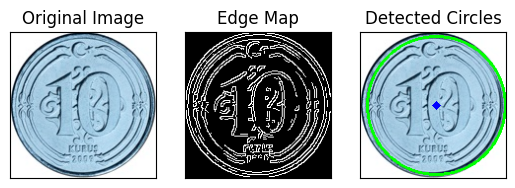

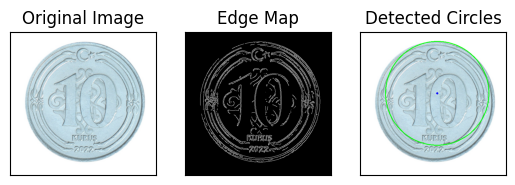

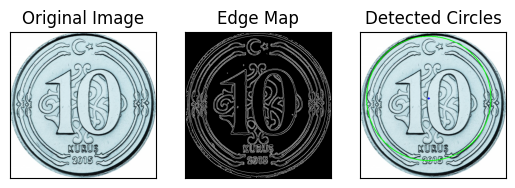

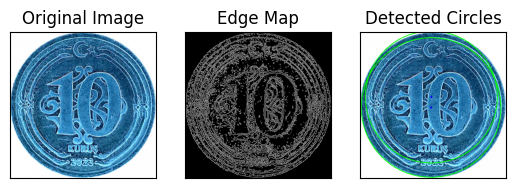

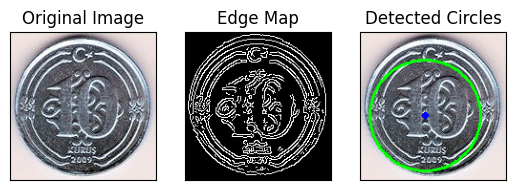

...

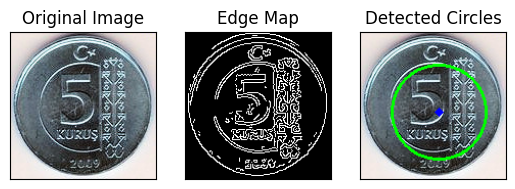

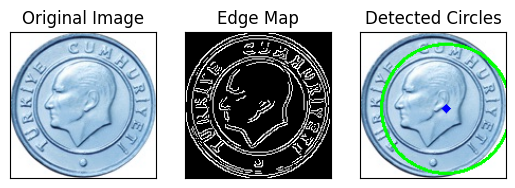

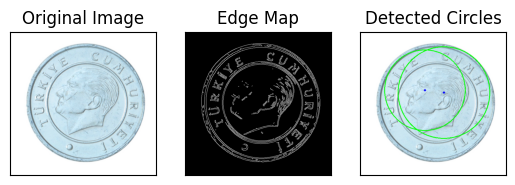

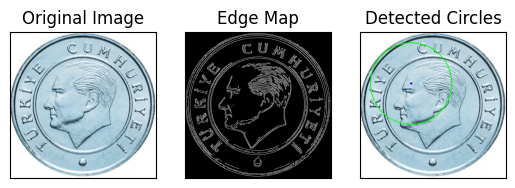

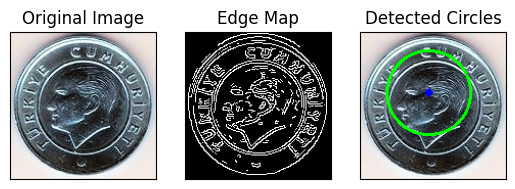

In [11]:
train_folder = 'Train'
train_detected_circles = process_images_in_folder(train_folder,500,2,False,120, 150)

The process_images_in_folder function is executed on the 'TestV' folder. This involves resizing images to a target width of 500 pixels, applying a threshold value of 500 for circle detection in test images, and utilizing Canny edge detection thresholds set at 30 and 250. The resulting detected circles for each processed image in the 'TestV' folder are stored in the testv_detected_circles variable. This collection of detected circles provides valuable insights into the distinctive features present in the test images, aiding in further analysis or evaluation.

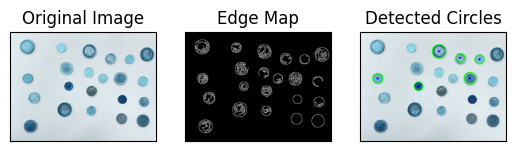

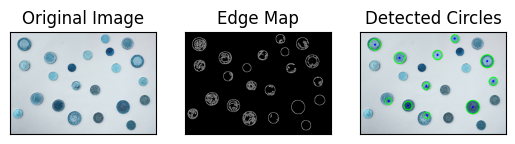

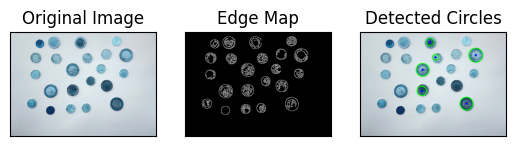

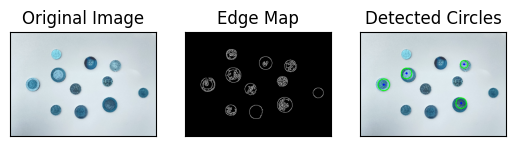

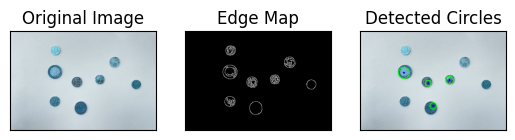

...

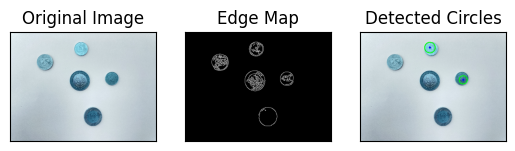

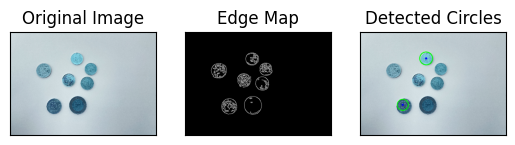

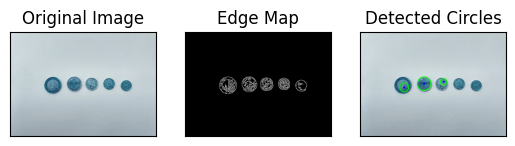

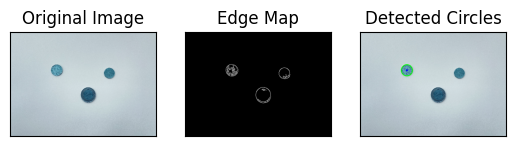

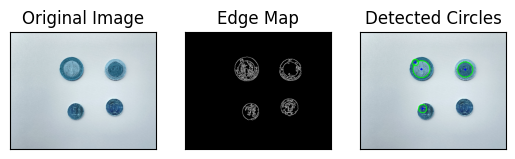

In [12]:
testv_folder = 'TestV'
testv_detected_circles = process_images_in_folder(testv_folder,500,500,True,30,250)

The process_images_in_folder function is executed on the 'TestR' folder, wherein images are resized to a target width of 500 pixels. A threshold value of 1100 is applied for circle detection in test images, and Canny edge detection thresholds are set at 20 and 220. The resulting detected circles for each processed image in the 'TestR' folder are stored in the testr_detected_circles variable. This collection of detected circles serves as a valuable dataset, capturing distinctive features present in the test images, which can be further analyzed or utilized for various purposes.

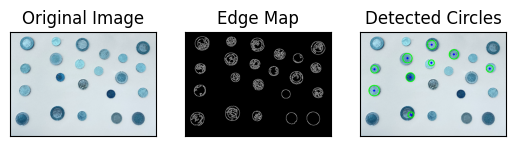

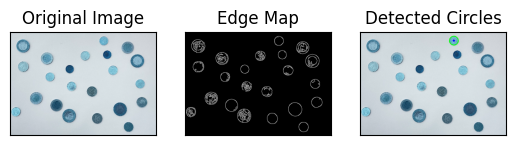

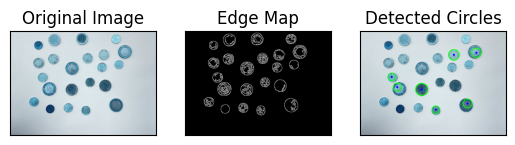

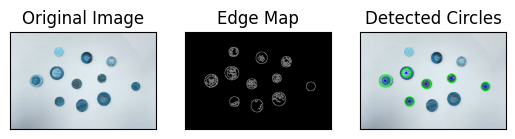

In [13]:
testr_folder = 'TestR'
testr_detected_circles = process_images_in_folder(testr_folder,500,1100,True,20,220)

# PART 2: Histogram of Oriented Gradients

The Histogram of Oriented Gradients (HOG) is a feature descriptor widely used in computer vision for object detection. It involves dividing an image into small regions, computing the gradient orientation within each region, and creating histograms of these orientations. The resulting feature vector captures the distribution of gradient directions, providing a representation that is robust to variations in lighting and background. HOG is particularly effective for human detection in images and has been a key component in various object recognition tasks.

The calculate_gradients function employs Sobel filters to compute the gradient magnitudes and angles of an input image. By convolving the image with these filters, it extracts information about both horizontal and vertical intensity changes. The resulting magnitudes and angles are fundamental features, offering insights into directional gradients within the image. The function's modular and readable design, coupled with meaningful variable names, enhances code quality and facilitates further utilization of these gradient features in subsequent image processing tasks.

### Util Functions

In [14]:
def calculate_gradients(image):
    """
    Calculate image gradients using Sobel filters.

    Parameters:
    - image: The input image.

    Returns:
    - magnitude: Magnitude of the gradients.
    - angle: Gradient angles.
    """

    # Sobel kernels for gradient calculation
    kernel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    kernel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    # Convolve image with Sobel kernels
    gradient_x = signal.convolve2d(image, kernel_x, mode='same', boundary='symm')
    gradient_y = signal.convolve2d(image, kernel_y, mode='same', boundary='symm')

    # Compute gradient magnitude and angle
    magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    angle = np.arctan2(gradient_y, gradient_x)

    return magnitude, angle

The calculate_histogram function computes the Histogram of Oriented Gradients (HOG) for a given image region. Dividing the region into cells, it constructs histograms capturing gradient orientations. The function utilizes magnitude and angle information, along with parameters like cell_size and bins. Employing nested loops, it calculates cell-wise histograms, forming a 3D array (histogram). This HOG representation encapsulates essential directional gradient features within the specified image region.

In [15]:
def calculate_histogram(magnitude, angle, cell_size=(8, 8), bins=9):
    """
    Calculate the Histogram of Oriented Gradients (HOG) for a given image region.

    Parameters:
    - magnitude: Magnitude of image gradients.
    - angle: Gradient angles.
    - cell_size: Size of the cells for histogram calculation.
    - bins: Number of bins in the histogram.

    Returns:
    - histogram: Computed HOG histogram.
    """

    cell_height, cell_width = cell_size
    num_cells_y, num_cells_x = magnitude.shape[0] // cell_height, magnitude.shape[1] // cell_width

    histogram = np.zeros((num_cells_y, num_cells_x, bins))

    for i in range(num_cells_y):
        for j in range(num_cells_x):
            cell_magnitude = magnitude[i * cell_height:(i + 1) * cell_height,
                             j * cell_width:(j + 1) * cell_width]
            cell_angle = angle[i * cell_height:(i + 1) * cell_height,
                         j * cell_width:(j + 1) * cell_width]

            histogram[i, j, :], _ = np.histogram(cell_angle, bins=bins, range=(0, 2 * np.pi),
                                                 weights=cell_magnitude)

    return histogram

The block_normalization function conducts block normalization on a given Histogram of Oriented Gradients (HOG) histogram. It divides the histogram into blocks, normalizes each block, and flattens the result. The function takes parameters like block_size and epsilon for customization. Utilizing nested loops, it iterates through the blocks, applying normalization using the L2 norm with a small epsilon for numerical stability. The output, normalized_blocks, represents the normalized HOG blocks, providing a refined feature representation.

In [16]:
def block_normalization(histogram, block_size=(2, 2), epsilon=1e-5):
    """
    Perform block normalization on the given HOG histogram.

    Parameters:
    - histogram: HOG histogram.
    - block_size: Size of the blocks for normalization.
    - epsilon: Small constant for numerical stability.

    Returns:
    - normalized_blocks: Normalized HOG blocks.
    """

    block_height, block_width = block_size
    num_blocks_y, num_blocks_x, bins = histogram.shape

    normalized_blocks = np.zeros((num_blocks_y - block_height + 1,
                                  num_blocks_x - block_width + 1,
                                  block_height * block_width * bins))

    for i in range(num_blocks_y - block_height + 1):
        for j in range(num_blocks_x - block_width + 1):
            block = histogram[i:i + block_height, j:j + block_width, :]
            normalized_blocks[i, j, :] = block.flatten() / np.sqrt(np.sum(block**2) + epsilon)

    return normalized_blocks

The hog_feature_extraction function encapsulates the process of extracting Histogram of Oriented Gradients (HOG) features from a given image. It begins by calculating gradients using the calculate_gradients function, then computes histograms with the calculate_histogram function, and finally performs block normalization via block_normalization. The resulting normalized blocks are flattened into a feature vector, providing a concise representation of the image's distinctive gradient information.

In [17]:
def hog_feature_extraction(image, cell_size=(8, 8), block_size=(2, 2), bins=9):
    """
    Extract Histogram of Oriented Gradients (HOG) features from the given image.

    Parameters:
    - image: The input image.
    - cell_size: Size of the cells for histogram calculation.
    - block_size: Size of the blocks for normalization.
    - bins: Number of bins in the histogram.

    Returns:
    - feature_vector: HOG feature vector.
    """

    magnitude, angle = calculate_gradients(image)

    histogram = calculate_histogram(magnitude, angle, cell_size=cell_size, bins=bins)

    normalized_blocks = block_normalization(histogram, block_size=block_size)

    feature_vector = normalized_blocks.flatten()

    return feature_vector

The function extract_circle_rois_and_features processes an input image, identifying circles using a provided set of detected circles. It resizes and blurs the image, then extracts circular regions of interest (ROIs) around each detected circle. These ROIs are resized for consistency and stored in a list (img_circle_roi_arr). Additionally, Histogram of Oriented Gradients (HOG) features are computed for each ROI, forming a corresponding list of feature vectors (img_circle_roi_features).

In [18]:
def extract_circle_rois_and_features(image_path, detected_circles):
    """
    Extract circle regions of interest (ROIs) and their corresponding Histogram of Oriented Gradients (HOG) features.

    Parameters:
    - image_path: Path to the input image.
    - detected_circles: List of detected circles represented as tuples (x, y, r).

    Returns:
    - img_circle_roi_arr: List of circle ROIs.
    - img_circle_roi_features: List of HOG features extracted from circle ROIs.
    """

    original_image = cv2.imread(image_path)
    resized_image, new_width = resize_image(original_image, 500)
    blurred_image = cv2.cvtColor(cv2.GaussianBlur(resized_image, (3, 3), 0), cv2.COLOR_BGR2GRAY)

    img_circle_roi_arr = []
    img_circle_roi_features = []

    for circle in detected_circles:
        center = (circle[0], circle[1])
        radius = circle[2]
        circle_roi = blurred_image[center[1]-radius:center[1]+radius, center[0]-radius:center[0]+radius]
        circle_roi = cv2.resize(circle_roi, (250, 250))
        img_circle_roi_arr.append(circle_roi)

        fd = hog_feature_extraction(circle_roi)

        img_circle_roi_features.append(fd)

    return img_circle_roi_arr, img_circle_roi_features

The visualize_circled function is designed for visually comparing the original input image with another image where circles are labeled and highlighted. It utilizes Matplotlib to create a side-by-side display of the two images in a single figure with subplots. The first subplot showcases the original image, while the second subplot presents the image with labeled circles. This function serves as a convenient tool for inspecting the effectiveness of circle labeling and enables a quick visual assessment of the algorithm's performance.

In [19]:
def visualize_circled(original_image, circled_image):
    """
    Display the original image and an image with labeled circles side by side.

    Parameters:
    - original_image: The original input image.
    - circled_image: The image with labeled circles.

    Returns:
    - None
    """

    # Set up a figure with subplots
    plt.figure(figsize=(15, 15))

    # Original Image subplot
    plt.subplot(131)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.xticks([]), plt.yticks([])

    # Labeled and Circled Image subplot
    plt.subplot(132)
    plt.imshow(circled_image)
    plt.title('Labeled and Circled Image')
    plt.xticks([]), plt.yticks([])

    # Show the figure
    plt.show()

This code iterates through the images in the 'TestV' folder, applies the extract_circle_rois_and_features function to each image using the corresponding detected circles, and appends the resulting circle ROIs and features to the respective lists (testv_circle_roi_arr and testv_circle_roi_features). Please ensure you have the appropriate method to generate testv_detected_circles.

In [20]:
testv_circle_roi_arr = []
testv_circle_roi_features = []

testv_folder = 'TestV'
image_paths = [os.path.join(testv_folder, file) for file in os.listdir(testv_folder) if file.endswith(('.jpg'))]

for i, image_path in enumerate(image_paths):
    detected_circles = testv_detected_circles[i] 
    img_circle_roi_arr, img_circle_roi_features = extract_circle_rois_and_features(image_path, detected_circles)

    testv_circle_roi_arr.append(img_circle_roi_arr)
    testv_circle_roi_features.append(img_circle_roi_features)

The following part processes images in the 'Train' folder for training a model. It starts by creating a list of image paths named 'coin_images' based on JPG file extensions in the 'Train' folder. Two empty lists, 'features' and 'labels', are initialized to store extracted Histogram of Oriented Gradients (HOG) features and corresponding labels, respectively.

The script then iterates through each image in the 'Train' folder. For each image, it reads and resizes the image to dimensions (250, 250). Subsequently, Gaussian blur is applied, and the image is converted to grayscale. HOG features are then extracted from the blurred, resized grayscale image using the 'hog_feature_extraction' function.

The label for each image is derived from the file name, excluding the last two characters. Finally, the extracted features and corresponding labels are appended to the 'features' and 'labels' lists, respectively. This script sets up a dataset for training a machine learning model, with the HOG features serving as input features and labels as target outputs.

In [21]:
train_folder = 'Train'
coin_images = [os.path.join(train_folder, img) for img in os.listdir(train_folder)]

features = []
labels = []

# Iterate through each image in the training folder
for img_path in coin_images:
    # Read and resize the image
    image = cv2.imread(img_path)
    resized_image = cv2.resize(image, (250, 250))

    # Apply Gaussian blur and convert to grayscale
    blurred_resized_img = cv2.cvtColor(cv2.GaussianBlur(resized_image, (3, 3), 0), cv2.COLOR_BGR2GRAY)

    # Extract Histogram of Oriented Gradients (HOG) features
    fd = hog_feature_extraction(blurred_resized_img)

    # Extract label from the image file name (excluding the last two characters)
    label = (os.path.splitext(os.path.basename(img_path))[0])[:-2]

    # Append features and labels
    features.append(fd)
    labels.append(label)

### Creating a new SVM Model

In [22]:
# Create an SVM classifier
svm_model = SVC()

# Train the SVM model using the extracted features and labels
svm_model.fit(features, labels)


SVC()

### Labeling TestV Images and Visualizing

The following part is a script for processing images in the 'TestV' folder. It begins by defining input and output folders, namely 'TestV' and 'TestV_HoG' respectively. A list of image paths is generated based on JPG file extensions found in the input folder. The script then iterates through each image, reads and resizes it to a width of 500 pixels.

Within the loop, a copy of the original image is created for subsequent circle labeling. Detected circles, obtained from the 'testv_detected_circles' variable, are iterated over. For each circle, it is visually labeled on the copied image by drawing both the circle and an outer contour. Additionally, a label prediction is made for each circle using a Support Vector Machine (SVM) model ('svm_model') based on Histogram of Oriented Gradients (HOG) features.

The labeled and original images are combined side by side, and the resulting image is saved in the 'TestV_HoG' folder. Finally, the 'visualize_circled' function is called to display the original and labeled images for visual inspection. The code emphasizes modularity, utilizing functions for image processing and visualization, and adheres to coding best practices such as meaningful variable names and comments.

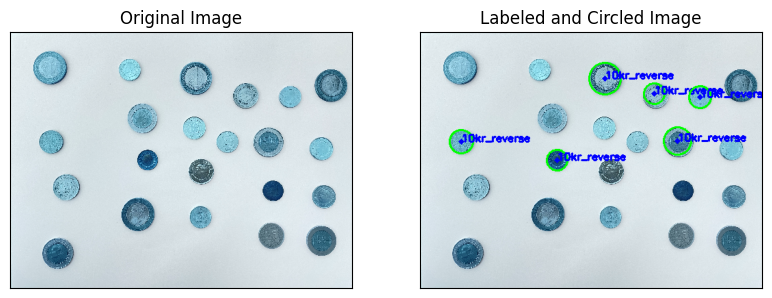

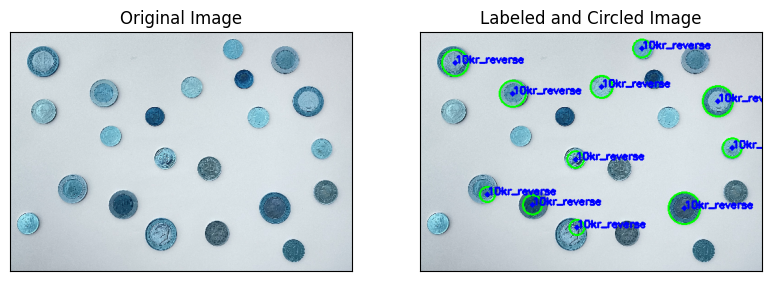

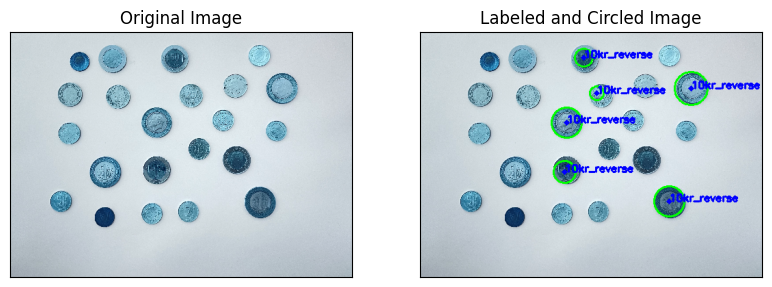

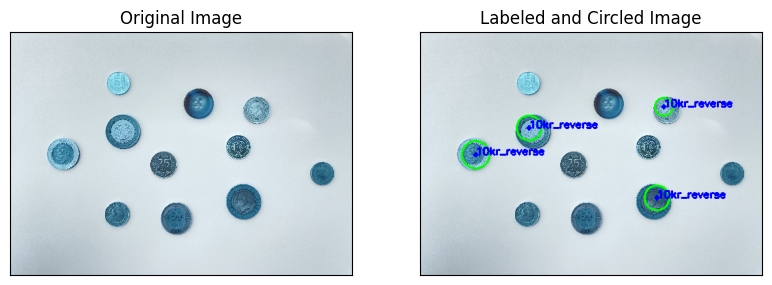

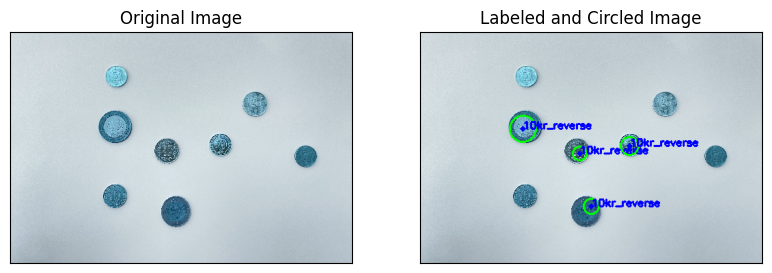

...

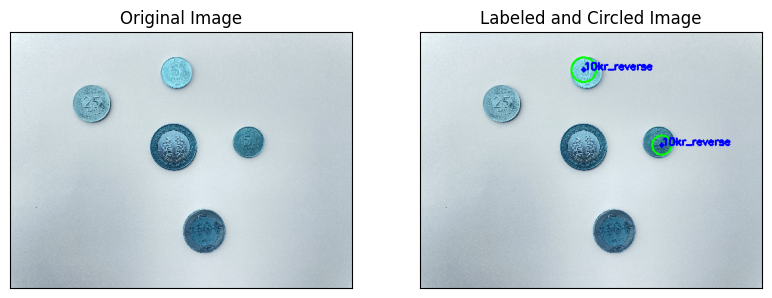

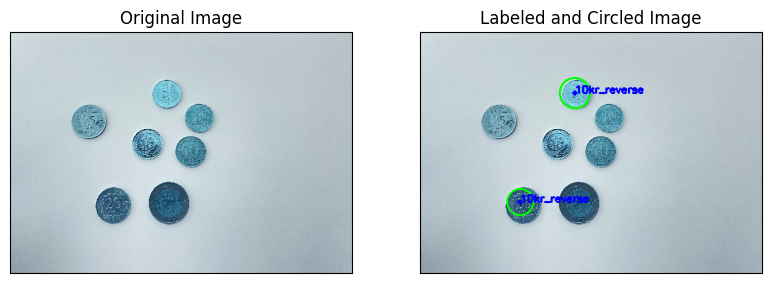

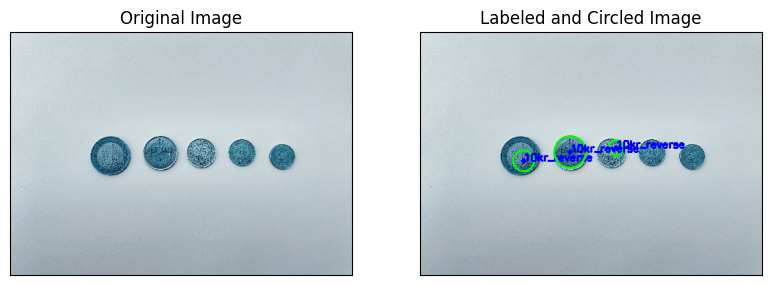

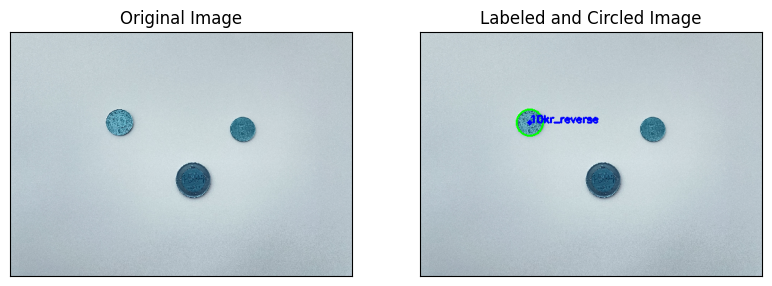

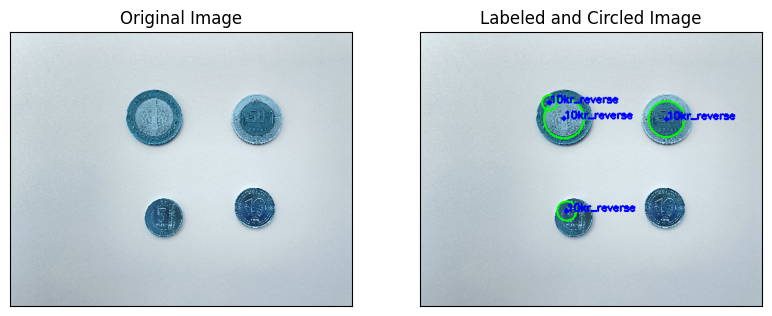

In [23]:
# Define input and output folders
testv_folder = 'TestV'
result_folder = 'TestV_HoG'
os.makedirs(result_folder, exist_ok=True)

# Get a list of image paths in the input folder
image_paths = [os.path.join(testv_folder, file) for file in os.listdir(testv_folder) if file.endswith(('.jpg'))]

# Process each image in the input folder
for image_path in image_paths:
    # Read and resize the original image
    original_image = cv2.imread(image_path)
    original_image, new_width = resize_image(original_image, 500)

    # Create a copy of the original image for circle labeling
    circled_image = original_image.copy()

    # Retrieve detected circles for the current image
    circles = testv_detected_circles[image_paths.index(image_path)]

    # Label and visualize circles in the image
    for circle in circles:
        center = (circle[0], circle[1])
        radius = circle[2]

        # Draw circles and labels on the copied image
        cv2.circle(circled_image, center, radius, (0, 255, 0), 2)
        cv2.circle(circled_image, center, 2, (0, 0, 255), 3)

        # Predict label for each circle using the SVM model
        label = svm_model.predict([np.array(testv_circle_roi_features[image_paths.index(image_path)][circles.index(circle)])])[0]

        # Display predicted label next to the circle
        cv2.putText(circled_image, str(label), (center[0], center[1]), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # Concatenate the original and circled images side by side
    combined_image = np.concatenate((original_image, circled_image), axis=1)

    # Save the combined image in the output folder
    result_file_path = os.path.join(result_folder, os.path.basename(image_path))
    cv2.imwrite(result_file_path, combined_image)

    # Visualize the original and circled images
    visualize_circled(original_image, circled_image)

## Bonus Part - Applying the same procedure for the images at the "TestR" folder.

In [25]:
testr_circle_roi_arr = []
testr_circle_roi_features = []

testr_folder = 'TestR'
testr_image_paths = [os.path.join(testr_folder, file) for file in os.listdir(testr_folder) if file.endswith(('.jpg'))]

for i, image_path in enumerate(testr_image_paths):
    detected_circles = testr_detected_circles[i]
    img_circle_roi_arr, img_circle_roi_features = extract_circle_rois_and_features(image_path, detected_circles)

    testr_circle_roi_arr.append(img_circle_roi_arr)
    testr_circle_roi_features.append(img_circle_roi_features)

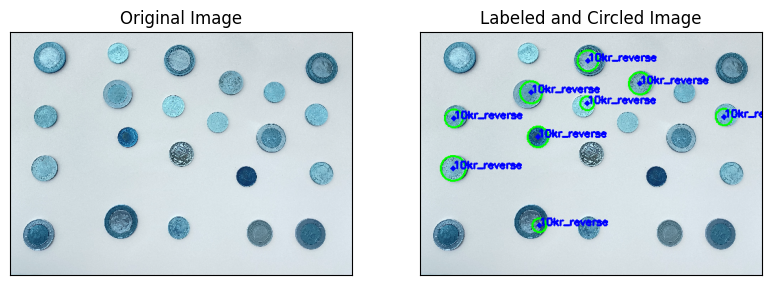

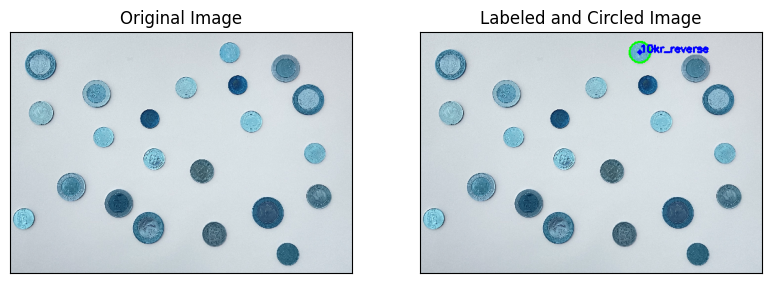

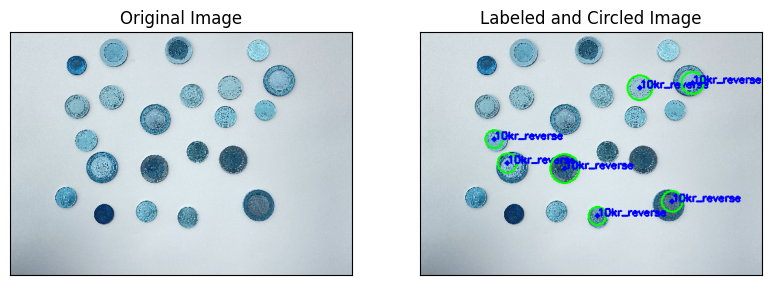

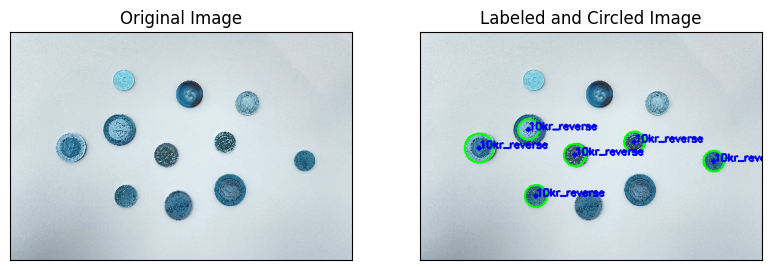

In [26]:
result_folder = 'TestR_HoG'
os.makedirs(result_folder, exist_ok=True)

for j, image_path in enumerate(testr_image_paths):
    original_image = cv2.imread(image_path)
    original_image, new_width = resize_image(original_image, 500)
    circled_image = original_image.copy()
    circles = testr_detected_circles[j]

    for i, circle in enumerate(circles):
        center = (circle[0], circle[1])
        radius = circle[2]

        cv2.circle(circled_image, center, radius, (0, 255, 0), 2)
        # Draw the outer circle
        cv2.circle(circled_image, center, 2, (0, 0, 255), 3)

        # Make predictions for each circle
        # Adjust this part according to your own model
        label = svm_model.predict([np.array(testr_circle_roi_features[j][i])])[0]

        # Write the label next to the circle
        cv2.putText(circled_image, str(label), (center[0], center[1]), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    combined_image = np.concatenate((original_image, circled_image), axis=1)
    result_file_path = os.path.join(result_folder, os.path.basename(image_path))
    cv2.imwrite(result_file_path, combined_image)
    visualize_circled(original_image, circled_image)